# 1. Let's import a bunch of stuff

In [1]:
import sys
import seaborn as sb
import scanpy.api as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
import statsmodels.formula.api as smf
import argparse
import gc
import scvelo as scv
%matplotlib inline

In [2]:
adata = sc.read('/ye/yelabstore3/Richard/PlottingScripts/ez_scanpy/V5.1/CLUESImmVarTcell.V5.1.h5ad')
print(adata)

AnnData object with n_obs × n_vars = 377209 × 1458 
    obs: 'disease_cov', 'ct_cov', 'pop_cov', 'ind_cov', 'well', 'batch_cov', 'batch', 'percent_mito', 'n_counts', 'SLEDAI', 'Broad', 'Female', 'PF4', 'SDPR', 'GNG11', 'PPBP', 'PC1', 'PC2', 'immvar8.30', 'immvar8.31', 'immvar9.7', 'lupus1.10', 'lupus7.13', 'lupus7.19', 'lupus7.20', 'lupus7.26', 'lupus8.2', 'lupus8.3', 'lupus8.9', 'lupus8.16', 'lupus8.17', 'lupus8.23', 'louvain', 'leiden'
    var: 'gene_ids-0-0-0-0-0-0-0-0-0-0-0-0-0', 'gene_ids-1-0-0-0-0-0-0-0-0-0-0-0-0', 'gene_ids-1-0-0-0-0-0-0-0-0-0-0-0', 'gene_ids-1-0-0-0-0-0-0-0-0-0-0', 'gene_ids-1-0-0-0-0-0-0-0-0-0', 'gene_ids-1-0-0-0-0-0-0-0-0', 'gene_ids-1-0-0-0-0-0-0-0', 'gene_ids-1-0-0-0-0-0-0', 'gene_ids-1-0-0-0-0-0', 'gene_ids-1-0-0-0-0', 'gene_ids-1-0-0-0', 'gene_ids-1-0-0', 'gene_ids-1-0', 'gene_ids-1', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'batch_cov_colors', 'ct_cov_colors', 'diffmap_evals', 'disease_cov_colors', 'leiden', 'leiden_colors',

# 2. Let's first cluster with slightly lower resolution

In [3]:
adata.obs.leiden.to_csv("leiden.txt")

## 2.1. Also plot some differentially expressed genes

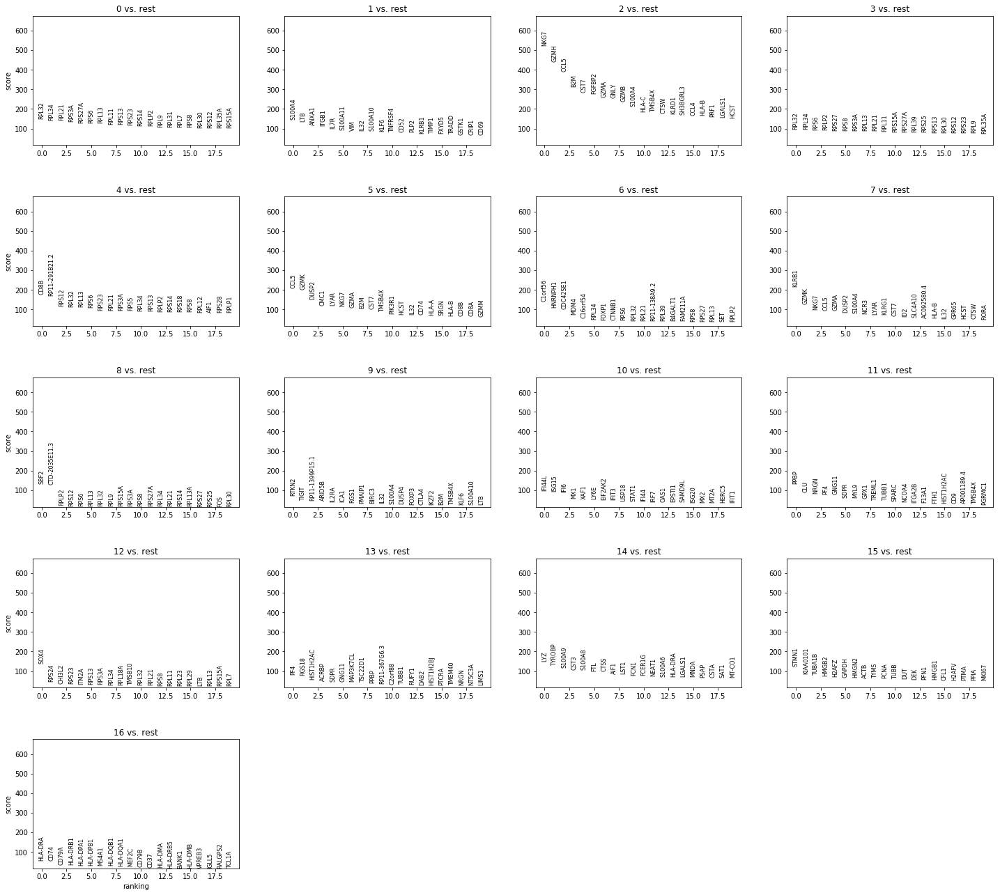

In [4]:
#get visualization of all markers and their scores
sc.pl.rank_genes_groups(adata)

## 2.2. And of course UMAP with the louvain clusters highlighted

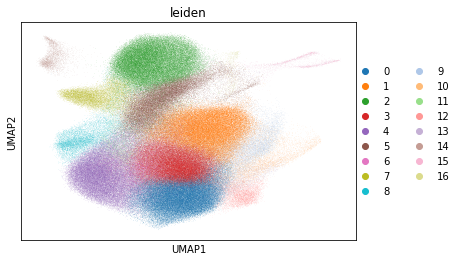

In [5]:
#plot UMAP of cell types colored by clusters
adata.uns['louvain_colors'] = sc.pl.palettes.vega_20_scanpy;
sc.pl.umap(adata, color='leiden')

# 3. Now let's plot differences in cluster proportion

as a proportion of cell type
Cluster type:0
Beta=3.920089990276249, pvalue=0.017390550122705777
Cluster type:1
Beta=-4.699522410610604, pvalue=0.0004972277085326912
Cluster type:2
Beta=-10.007542402367138, pvalue=9.039870147125728e-06
Cluster type:3
Beta=11.271021007533342, pvalue=1.8485126806873651e-31
Cluster type:4
Beta=2.488396925749443, pvalue=0.03381553709963493
Cluster type:5
Beta=-4.902660197357467, pvalue=2.9507273650158404e-07
Cluster type:6
Beta=3.068126586391613, pvalue=1.7587314610523728e-25
Cluster type:7
Beta=3.745773752610391, pvalue=9.486079390955468e-15


<Figure size 1080x576 with 0 Axes>

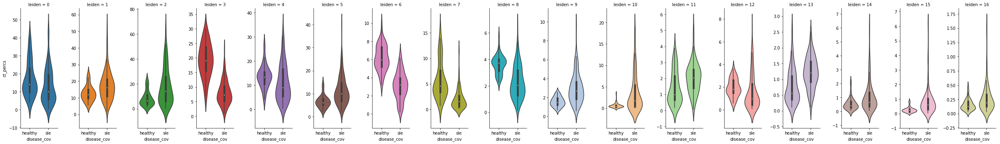

In [6]:
#get counts of cells for each cluster
ct_counts=adata.obs.groupby(['ind_cov', 'disease_cov','leiden'])['leiden'].count()
ct_percs = ct_counts/ct_counts.groupby(level=[0]).transform(sum)*100
ct_percs = ct_percs.reset_index(name='ct_percs')
ct_percs.ind_cov = ct_percs.ind_cov.apply(lambda x: x.split('_')[0])
ct_percs.ind_cov = ct_percs.ind_cov.astype("str")
ct_percs.reset_index(inplace=True)
ct_percs.leiden = ct_percs.leiden.astype("category")
ct_df=ct_percs.unstack(level=2, fill_value=0)

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell type')
for ct_i in list(range(0,8)):
    ct = ct_percs.leiden.cat.categories[ct_i]
    ct_perc = ct_percs.ct_percs[ct_percs.leiden==ct]
    disease = ct_percs.disease_cov[ct_percs.leiden==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    print('Cluster type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))

# #box plot as a proportion of cell type
# vars=[str(x) for x in list(range(n_cts))]
# ct_df['ind_cov']=ct_df.index.get_level_values('ind_cov').tolist()
# ct_df.index=ct_df['ind_cov']
# melted=pd.melt(ct_df, id_vars=['ind_cov', 'disease'], value_vars=vars)

#plot=sb.boxplot(x='disease', y='value', hue=ct_arg, data=melted).get_figure()
plt.figure(figsize=(15,8))
plot=sb.catplot(x='disease_cov', y='ct_percs', hue='leiden', data=ct_percs, kind='violin', col='leiden', dodge=False, aspect=0.4, sharex=False, sharey=False, palette=sc.pl.palettes.vega_20_scanpy)
#plt.subplots_adjust(wspace=0.03)

# 4. Let's also plot the absolutely abundance of each cluster

In [7]:
## Let's grab the clinical and labs data and compare to our single cell estimates
clues_clinical = pd.read_table("v2.clinical.data.txt", index_col=False)
clues_clinical.genotypeid = clues_clinical.genotypeid.apply(lambda x: x.split('_')[0])
clues_clinical.subjectid = clues_clinical.subjectid.astype("str")
joined = ct_percs.join(clues_clinical.set_index('genotypeid'), on='ind_cov')

t1_labs = pd.read_table("T1labs.csv",sep=",")
t1_labs.SubjectID = t1_labs.SubjectID.astype("str")
joined = joined.join(t1_labs.set_index('SubjectID'), on='subjectid')

### test new code
joined.AbsBaso = joined.AbsBaso/1000
joined.AbsEosino = joined.AbsEosino/1000
joined.AbsLympho = joined.AbsLympho/1000
joined.AbsNeutro = joined.AbsNeutro/1000
joined.AbsMono = joined.AbsMono/1000

joined = joined.assign(pbmc = joined.WhiteBloodCell-joined.AbsNeutro-joined.AbsEosino-joined.AbsBaso)

joined[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(str)

## now let's add in white blood cell counts for the immvar patients
immvar_pbmc = pd.read_table("immvar.pbmc.csv", index_col=False, sep=",")
immvar_pbmc.pbmc = immvar_pbmc.pbmc - (np.mean(immvar_pbmc.pbmc) - np.mean(joined.pbmc))

## this is not the most efficient code but will suffice for now
for i in list(range(12)) :
    igtb = immvar_pbmc.immvarid[i]
    joined.pbmc[joined.ind_cov==igtb] = immvar_pbmc.pbmc[i]

joined = joined.assign(estimate=joined.ct_percs/100*joined.pbmc)

joined[["ind_cov","disease_cov","leiden"]] = joined[["ind_cov","disease_cov","leiden"]].astype(str)
joined.plaquenilnow = joined.plaquenilnow.fillna(0)
joined.cellceptnow = joined.cellceptnow.fillna(0)
joined.steroralnow = joined.steroralnow.fillna(0)
joined.acrlymphopenia = joined.acrlymphopenia.fillna(0)

joined_pivot = joined.pivot_table(index=['ind_cov',"disease_cov","pbmc","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia"], columns="leiden", values="estimate")
joined_pivot.reset_index(inplace=True)
joined_pivot = joined_pivot[joined_pivot.pbmc > 0]
joined_pivot.disease_cov = pd.Categorical(joined_pivot.disease_cov,categories=['healthy','sle'], ordered=True)


/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


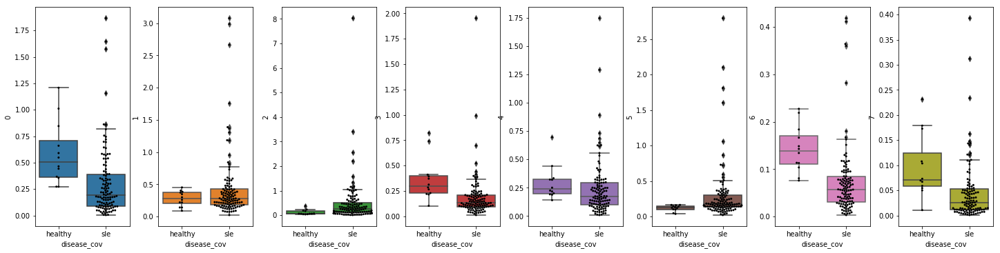

In [8]:
fig,ax = plt.subplots(nrows=1,ncols=8, figsize=(20,5))
fig.tight_layout()

for ct_i in list(range(0,8)):
    ct = ct_percs.leiden.cat.categories[ct_i]
    sb.boxplot(x="disease_cov", y=ct, data=joined_pivot, color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
    sb.swarmplot(x="disease_cov", y=ct, data=joined_pivot, color="0", size=3, ax=ax[ct_i])

# 5. Let's look at the IFN score now

In [12]:
ifn = pd.read_table("v2.ifn.sig.txt", sep=" ", index_col=False)
ifn.name = ifn.name.apply(lambda x: x.split('_')[0])
joined2 = ifn.join(joined.set_index("ind_cov"), on="name")
joined_pivot2 = joined2.pivot_table(index=['name',"disease_cov","pbmc","ifn","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia"], columns="leiden", values="estimate")
joined_pivot2.reset_index(inplace=True)

as a proportion of cell type
Cluster type:0
Beta=-0.036365875785578664, pvalue=5.271961053602569e-13
Cluster type:1
Beta=-0.013567819318382208, pvalue=0.10529760430128271
Cluster type:2
Beta=0.005047537982757781, pvalue=0.73322717242134
Cluster type:3
Beta=-0.014473682970122023, pvalue=6.410393448244605e-05
Cluster type:4
Beta=-0.0062427639749374104, pvalue=0.13000451732314774
Cluster type:5
Beta=-0.0005359188183457004, pvalue=0.9340580305774573
Cluster type:6
Beta=-0.005633635479985483, pvalue=7.92452037210753e-06
Cluster type:7
Beta=-0.0028183437442853335, pvalue=0.004845704298097323
Cluster type:8
Beta=-0.004140338500300554, pvalue=3.840915905929202e-06
Cluster type:9
Beta=-0.00016988072620085397, pvalue=0.8839844455413656
Cluster type:10
Beta=0.00864159328619397, pvalue=6.652288267138329e-16
Cluster type:11
Beta=-0.0029798921544652375, pvalue=3.36329590306706e-06
Cluster type:12
Beta=0.0002739668745809827, pvalue=0.5829448012204972
Cluster type:13
Beta=-0.0013292930351115413, pvalu

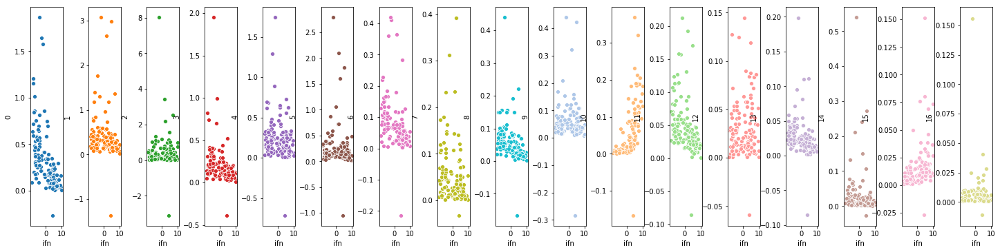

In [17]:
fig,ax = plt.subplots(nrows=1,ncols=len(np.unique(ct_percs.leiden)), figsize=(20,5))
fig.tight_layout()

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell type')
for ct_i in list(range(0,len(np.unique(ct_percs.leiden)))):
    ct = ct_percs.leiden.cat.categories[ct_i]
    ct_perc = joined_pivot2[ct]
    ifn = joined_pivot2.ifn
    ifn = sm.add_constant(ifn)
    print('Cluster type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), ifn.astype(float),missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
for ct_i in list(range(0,len(np.unique(ct_percs.leiden)))):
    ct = ct_percs.leiden.cat.categories[ct_i]
    sb.scatterplot(x="ifn", y=ct, data=joined_pivot2, color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
    ##sb.swarmplot(x="disease_cov", y=ct, data=joined_pivot, color="0", size=3, ax=ax[ct_i])

## let's only look at disease

as a proportion of cell type
Cluster type:0
Beta=-0.03489395338631034, pvalue=1.441119003270155e-10
Cluster type:1
Beta=-0.019467163702027078, pvalue=0.04064421823615212
Cluster type:2
Beta=-0.002554644177414786, pvalue=0.8795700148525496
Cluster type:3
Beta=-0.01223407228172866, pvalue=0.0016801126642702797
Cluster type:4
Beta=-0.005614232593901824, pvalue=0.22625402415557286
Cluster type:5
Beta=-0.004639543961738655, pvalue=0.5284467728752301
Cluster type:6
Beta=-0.004772998522539289, pvalue=0.0005660883164117086
Cluster type:7
Beta=-0.001998213445200021, pvalue=0.05867833021314017
Cluster type:8
Beta=-0.004077205257770188, pvalue=4.591111790968767e-05
Cluster type:9
Beta=-0.0008609265471780694, pvalue=0.5139205993549052
Cluster type:10
Beta=0.009004369737711349, pvalue=1.4706977790493577e-13
Cluster type:11
Beta=-0.0032412317973260097, pvalue=5.146880725320276e-06
Cluster type:12
Beta=0.00046545293453147737, pvalue=0.41560315398041625
Cluster type:13
Beta=-0.0015220668033898604, pva

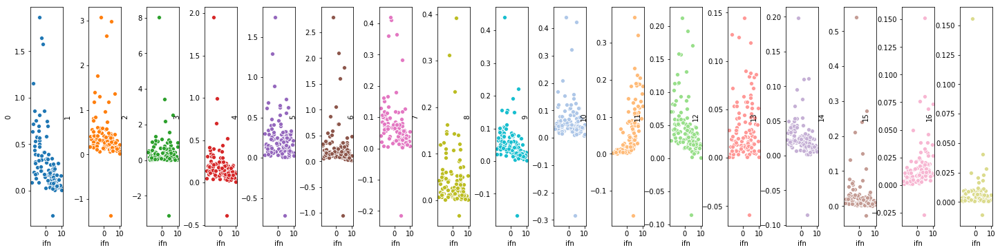

In [19]:
joined_pivot2_sle = joined_pivot2[joined_pivot2.disease_cov == "sle"]

fig,ax = plt.subplots(nrows=1,ncols=len(np.unique(ct_percs.leiden)), figsize=(20,5))
fig.tight_layout()

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell type')
for ct_i in list(range(0,len(np.unique(ct_percs.leiden)))):
    ct = ct_percs.leiden.cat.categories[ct_i]
    ct_perc = joined_pivot2_sle[ct]
    ifn = joined_pivot2_sle.ifn
    ifn = sm.add_constant(ifn)
    print('Cluster type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), ifn.astype(float),missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
for ct_i in list(range(0,len(np.unique(ct_percs.leiden)))):
    ct = ct_percs.leiden.cat.categories[ct_i]
    sb.scatterplot(x="ifn", y=ct, data=joined_pivot2_sle, color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
    ##sb.swarmplot(x="disease_cov", y=ct, data=joined_pivot, color="0", size=3, ax=ax[ct_i])

## let's only look at healthy

as a proportion of cell type
Cluster type:0
Beta=-0.12993633592904455, pvalue=0.032818541235609566
Cluster type:1
Beta=-0.010352144687685135, pvalue=0.6995185367034353
Cluster type:2
Beta=0.023684791177160318, pvalue=0.31977537378973175
Cluster type:3
Beta=-0.03580310460327701, pvalue=0.45975924037163507
Cluster type:4
Beta=-0.02055497324569893, pvalue=0.5512282785986701
Cluster type:5
Beta=0.002072597483547602, pvalue=0.829934808026026
Cluster type:6
Beta=-0.011269591985932657, pvalue=0.30803820148204264
Cluster type:7
Beta=0.0036913750696414825, pvalue=0.8030176255646632
Cluster type:8
Beta=-0.009245135951768214, pvalue=0.25251271685927973
Cluster type:9
Beta=-0.004609956471153298, pvalue=0.3254132022336843
Cluster type:10
Beta=-0.0008775428820281126, pvalue=0.43153252976861833
Cluster type:11
Beta=-0.011454458427968797, pvalue=0.09323502039694341
Cluster type:12
Beta=0.0007346203867910541, pvalue=0.7332987090038727
Cluster type:13
Beta=-0.005350997093476583, pvalue=0.069489627583452

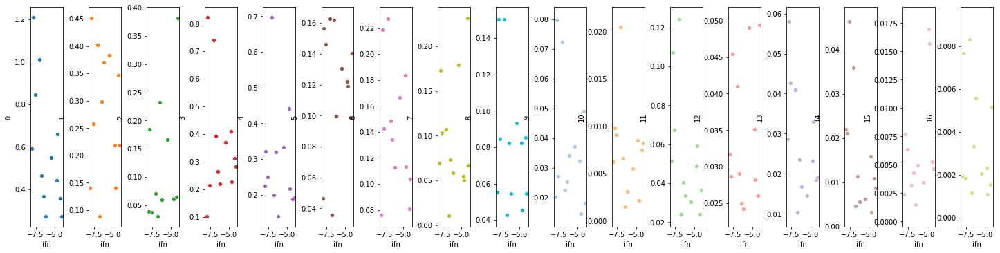

In [20]:
joined_pivot2_healthy = joined_pivot2[joined_pivot2.disease_cov == "healthy"]

fig,ax = plt.subplots(nrows=1,ncols=len(np.unique(ct_percs.leiden)), figsize=(20,5))
fig.tight_layout()

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell type')
for ct_i in list(range(0,len(np.unique(ct_percs.leiden)))):
    ct = ct_percs.leiden.cat.categories[ct_i]
    ct_perc = joined_pivot2_healthy[ct]
    ifn = joined_pivot2_healthy.ifn
    ifn = sm.add_constant(ifn)
    print('Cluster type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), ifn.astype(float),missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
for ct_i in list(range(0,len(np.unique(ct_percs.leiden)))):
    ct = ct_percs.leiden.cat.categories[ct_i]
    sb.scatterplot(x="ifn", y=ct, data=joined_pivot2_healthy, color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
    ##sb.swarmplot(x="disease_cov", y=ct, data=joined_pivot, color="0", size=3, ax=ax[ct_i])

# 6. Let's recompute the IFN score

In [21]:
diffexp_annot = pd.read_table("ifn.analysis/diffexp.annotations.txt", sep="\t", index_col=False)
diffexp_annot.cluster = diffexp_annot.cluster.astype("category")

In [22]:
for cluster_i in diffexp_annot.cluster.cat.categories:
    print(cluster_i)
    cluster_X = adata.X[:,adata.var_names.isin(diffexp_annot.gene[diffexp_annot.cluster==cluster_i])];
    adata.obs[cluster_i] = np.sum(cluster_X, axis=1)
    

all_ifn
cm_ifn
dc_specific
myeloid_ifn
tc_specific
th_specific


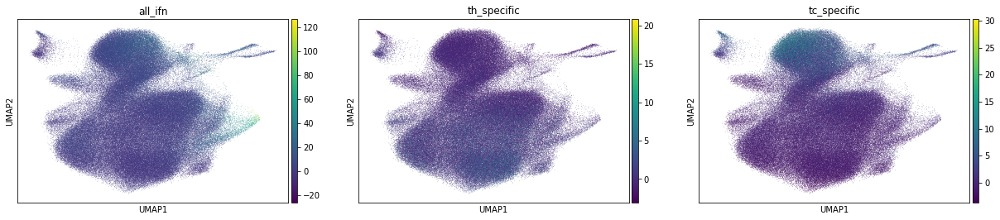

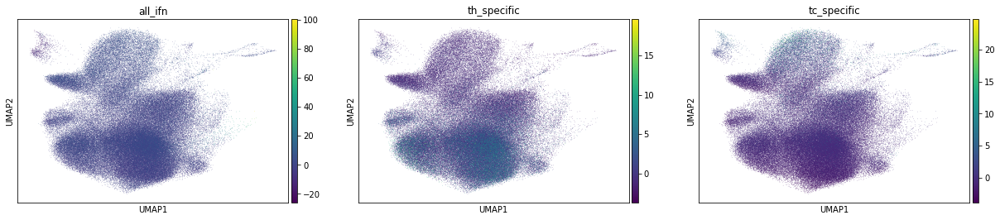

In [23]:
##fig,ax = plt.subplots(nrows=1,ncols=2, figsize=(10,5),sharex=True, sharey=True)
##fig.tight_layout()

sc.pl.umap(adata[adata.obs.disease_cov=="sle"], color=['all_ifn',"th_specific","tc_specific"], palette="Greys", size=1) ##, vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)
sc.pl.umap(adata[adata.obs.disease_cov=="healthy"], color=['all_ifn',"th_specific","tc_specific"], palette="Greys", size=1) ##,vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)



##sc.pl.umap(adata[adata.obs.disease_cov=="healthy",], color = "all_ifn", ax=ax[1])                                                      

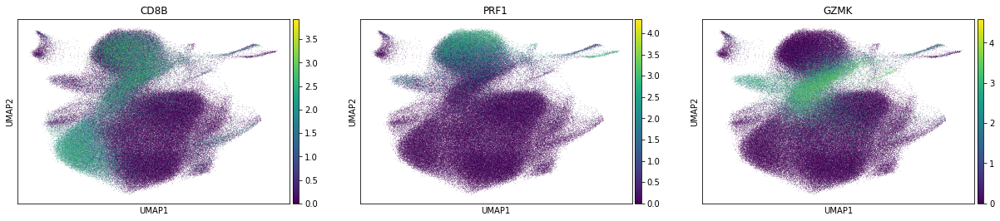

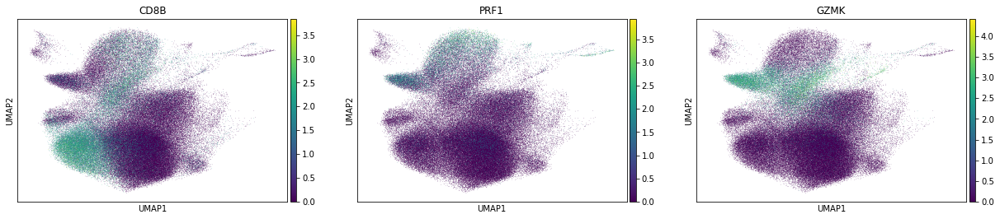

In [24]:

sc.pl.umap(adata[adata.obs.disease_cov=="sle"], color=['CD8B',"PRF1","GZMK"], palette="Greys", size=1) ##, vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)
sc.pl.umap(adata[adata.obs.disease_cov=="healthy"], color=['CD8B',"PRF1","GZMK"], palette="Greys", size=1) ##,vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)



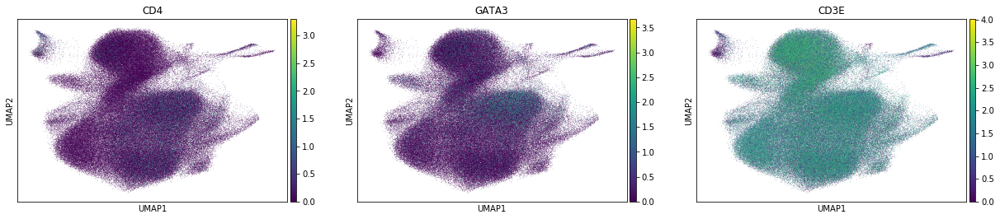

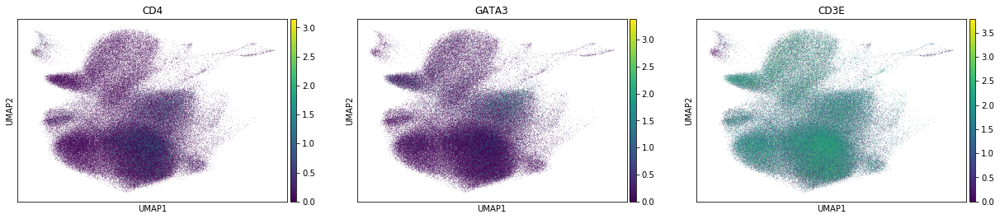

In [25]:


sc.pl.umap(adata[adata.obs.disease_cov=="sle"], color=['CD4',"GATA3","CD3E"], palette="Greys", size=1) ##, vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)
sc.pl.umap(adata[adata.obs.disease_cov=="healthy"], color=['CD4',"GATA3","CD3E"], palette="Greys", size=1) ##,vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)




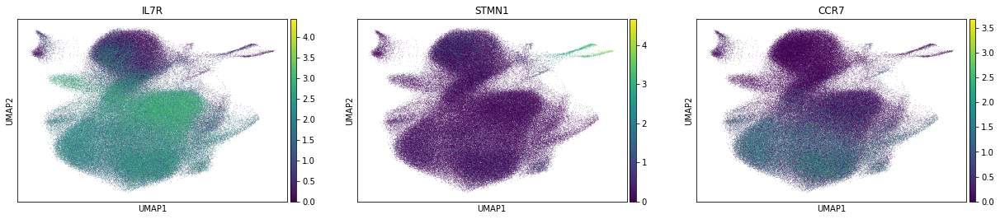

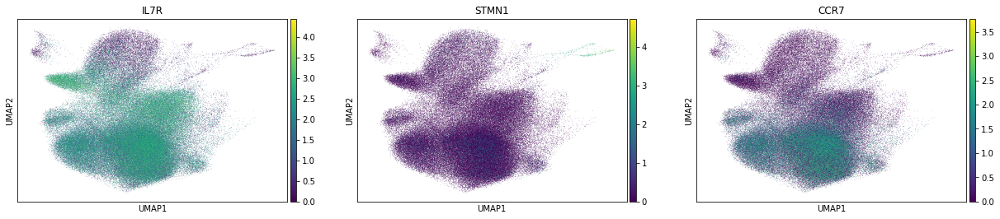

In [26]:

sc.pl.umap(adata[adata.obs.disease_cov=="sle"], color=['IL7R',"STMN1","CCR7"], palette="Greys", size=1) ##, vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)
sc.pl.umap(adata[adata.obs.disease_cov=="healthy"], color=['IL7R',"STMN1","CCR7"], palette="Greys", size=1) ##,vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)


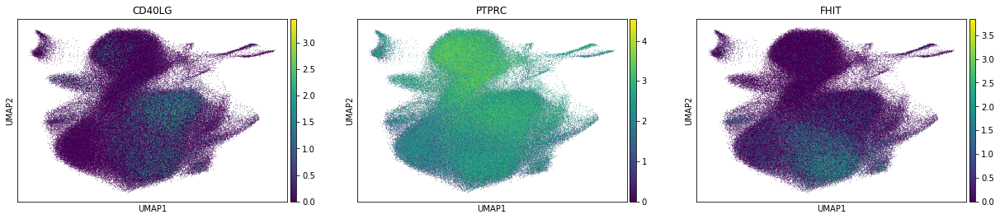

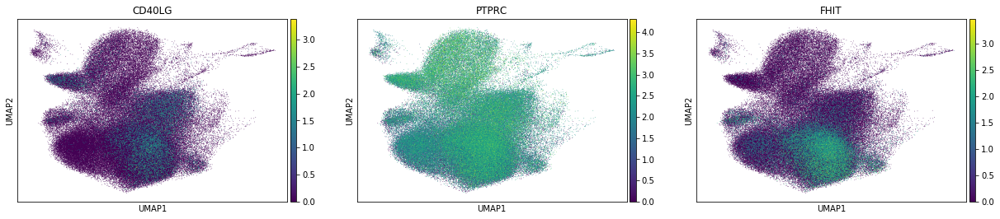

In [27]:

sc.pl.umap(adata[adata.obs.disease_cov=="sle"], color=['CD40LG',"PTPRC","FHIT"], palette="Greys", size=2) ##, vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)
sc.pl.umap(adata[adata.obs.disease_cov=="healthy"], color=['CD40LG',"PTPRC","FHIT"], palette="Greys", size=2) ##,vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)



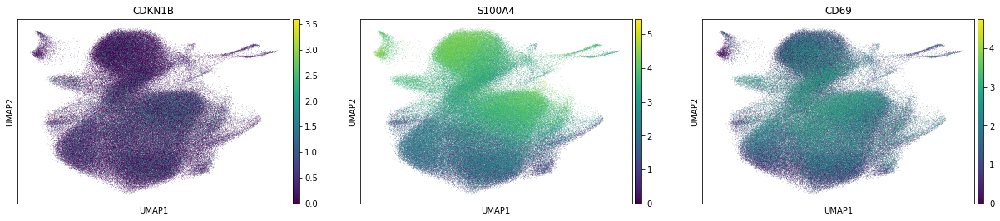

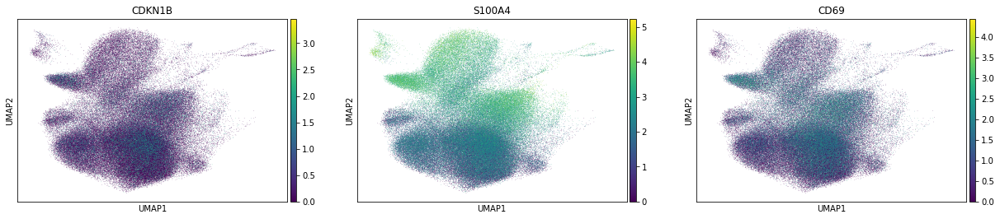

In [28]:

sc.pl.umap(adata[adata.obs.disease_cov=="sle"], color=['CDKN1B',"S100A4","CD69"], palette="Greys", size=1) ##, vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)
sc.pl.umap(adata[adata.obs.disease_cov=="healthy"], color=['CDKN1B',"S100A4","CD69"], palette="Greys", size=1) ##,vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)



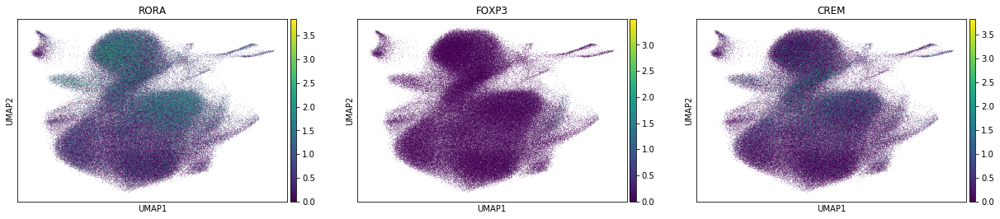

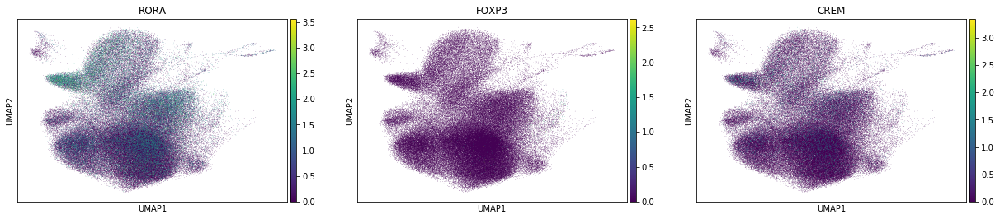

In [29]:

sc.pl.umap(adata[adata.obs.disease_cov=="sle"], color=['RORA',"FOXP3","CREM"], palette="Greys", size=1) ##, vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)
sc.pl.umap(adata[adata.obs.disease_cov=="healthy"], color=['RORA',"FOXP3","CREM"], palette="Greys", size=1) ##,vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)



# Memory vs. Naive vs. Th

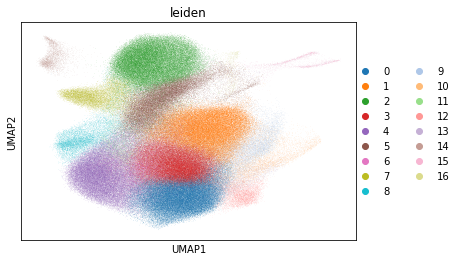

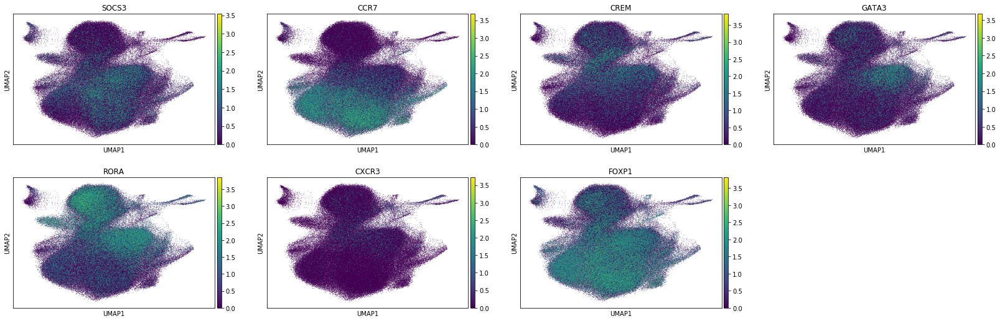

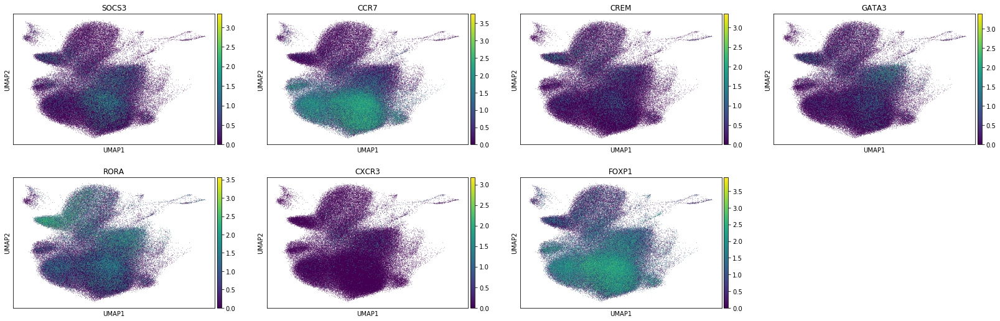

In [30]:
#plot UMAP of cell types colored by clusters
adata.uns['louvain_colors'] = sc.pl.palettes.vega_20_scanpy;
sc.pl.umap(adata, color='leiden')

sc.pl.umap(adata[adata.obs.disease_cov=="sle"], color=['SOCS3',"CCR7","CREM", "GATA3", "RORA", "CXCR3", "FOXP1"], palette="Greys", size=2) ##, vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)
sc.pl.umap(adata[adata.obs.disease_cov=="healthy"], color=['SOCS3',"CCR7","CREM", "GATA3", "RORA", "CXCR3", "FOXP1"], palette="Greys", size=2) ##,vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)




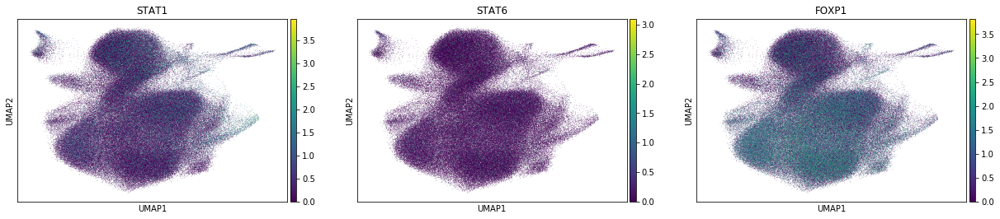

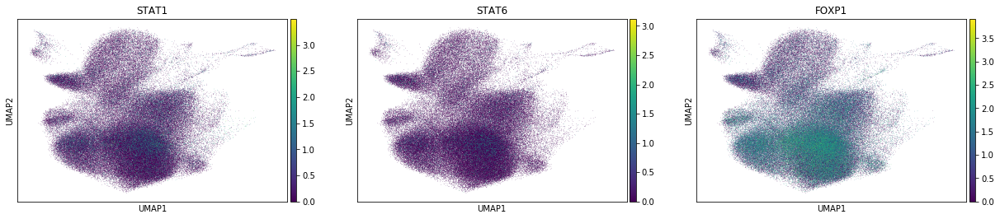

In [31]:

sc.pl.umap(adata[adata.obs.disease_cov=="sle"], color=['STAT1',"STAT6","FOXP1"], palette="Greys", size=1) ##, vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)
sc.pl.umap(adata[adata.obs.disease_cov=="healthy"], color=['STAT1',"STAT6","FOXP1"], palette="Greys", size=1) ##,vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)



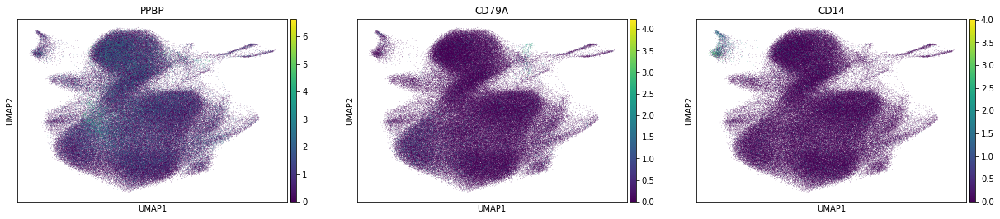

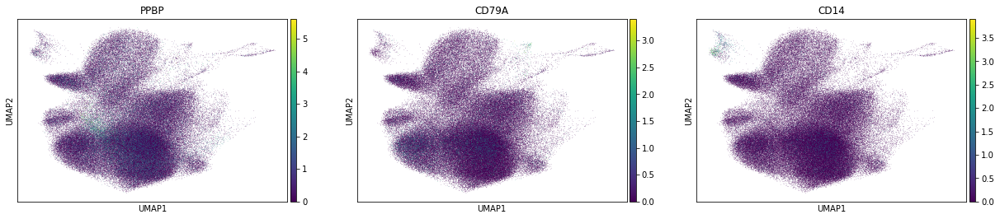

In [32]:

sc.pl.umap(adata[adata.obs.disease_cov=="sle"], color=['PPBP',"CD79A","CD14"], palette="Greys", size=1) ##, vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)
sc.pl.umap(adata[adata.obs.disease_cov=="healthy"], color=['PPBP',"CD79A","CD14"], palette="Greys", size=1) ##,vmin=min(adata.obs.all_ifn), vmax=max(adata.obs.all_ifn)*.75)


Cluster=0,Beta=0.2782699208099314, pvalue=0.3507036967736339
Cluster=1,Beta=-1.273079471627579, pvalue=0.018071764189770998
Cluster=2,Beta=-2.0154574471433513, pvalue=0.003214296062032693
Cluster=3,Beta=0.22054653897865975, pvalue=0.4873888536440131
Cluster=4,Beta=0.10543507706460115, pvalue=0.7694353305500236
Cluster=5,Beta=-1.8530525117780745, pvalue=0.0060408509181116895
Cluster=6,Beta=-0.1067394114194917, pvalue=0.7838456317935344
Cluster=7,Beta=-1.286075850249496, pvalue=0.04417083263246291


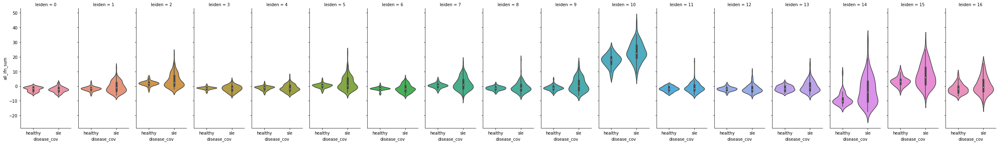

In [33]:
plot_df = adata.obs.groupby(['ind_cov','disease_cov','leiden'])['all_ifn'].mean()
plot_df = plot_df.reset_index(name='all_ifn_sum')

sb.catplot(x="disease_cov", y="all_ifn_sum", hue='leiden', data=plot_df, kind='violin', col='leiden', dodge=False, aspect=0.4, sharex=False, sharey=True)

##n_cts=ct_df.shape[1]-1
for cluster_i in list(range(0,8)):
    cluster = plot_df.leiden.cat.categories[cluster_i]
    all_ifn_sum = plot_df.all_ifn_sum[plot_df.leiden == cluster]
    disease = plot_df.disease_cov[plot_df.leiden==cluster].astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.OLS(all_ifn_sum.astype(float), disease.astype(float), missing='drop')
    ##est=sm.OLS("all_ifn~disease_cov", data=adata.obs.input,missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Cluster='+str(cluster)+',Beta='+str(effect)+', pvalue='+str(pval))

Cluster=0,Beta=0.010261995288614035, pvalue=0.879750892414783
Cluster=1,Beta=0.3699940173866373, pvalue=4.5636112858249686e-10
Cluster=2,Beta=-0.1048062389932514, pvalue=0.14788845079252672
Cluster=3,Beta=0.3214983830271495, pvalue=9.634640231155292e-07
Cluster=4,Beta=0.13819805354993223, pvalue=0.022291251119536733
Cluster=5,Beta=0.0692392419801416, pvalue=0.30409520194531076
Cluster=6,Beta=0.20218023945256586, pvalue=0.05081555177667918
Cluster=7,Beta=-0.1776308251286567, pvalue=0.2451083543702421


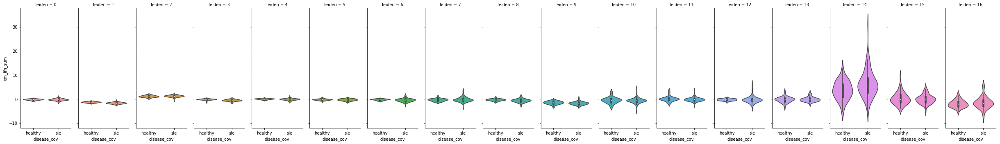

In [34]:
plot_df = adata.obs.groupby(['ind_cov','disease_cov','leiden'])['cm_ifn'].mean()
plot_df = plot_df.reset_index(name='cm_ifn_sum')

sb.catplot(x="disease_cov", y="cm_ifn_sum", hue='leiden', data=plot_df, kind='violin', col='leiden', dodge=False, aspect=0.4, sharex=False, sharey=True)

##n_cts=ct_df.shape[1]-1
for cluster_i in list(range(0,8)):
    cluster = plot_df.leiden.cat.categories[cluster_i]
    cm_ifn_sum = plot_df.cm_ifn_sum[plot_df.leiden == cluster]
    disease = plot_df.disease_cov[plot_df.leiden==cluster].astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.OLS(cm_ifn_sum.astype(float), disease.astype(float), missing='drop')
    ##est=sm.OLS("cm_ifn~disease_cov", data=adata.obs.input,missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Cluster='+str(cluster)+',Beta='+str(effect)+', pvalue='+str(pval))

Cluster=0,Beta=-0.15995070394723382, pvalue=0.03788213923932214
Cluster=1,Beta=0.4149604072208918, pvalue=6.936592306530124e-07
Cluster=2,Beta=0.07078195069016573, pvalue=0.35402294593974504
Cluster=3,Beta=0.13817414595495067, pvalue=0.16073565074160664
Cluster=4,Beta=0.3147418414775143, pvalue=0.006162243590098806
Cluster=5,Beta=0.29019400777897886, pvalue=0.0064560599610648155
Cluster=6,Beta=0.3267390898862437, pvalue=0.012480811945344415
Cluster=7,Beta=0.19467929412141222, pvalue=0.3246211042612296


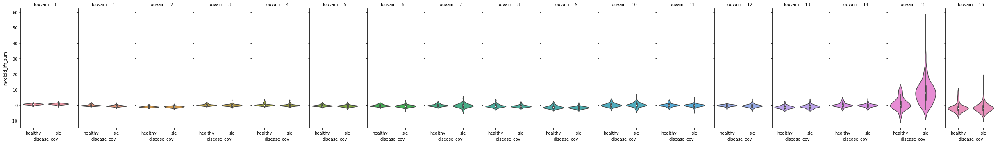

In [35]:
plot_df = adata.obs.groupby(['ind_cov','disease_cov','louvain'])['myeloid_ifn'].mean()
plot_df = plot_df.reset_index(name='myeloid_ifn_sum')

sb.catplot(x="disease_cov", y="myeloid_ifn_sum", hue='louvain', data=plot_df, kind='violin', col='louvain', dodge=False, aspect=0.4, sharex=False, sharey=True)

##n_cts=ct_df.shape[1]-1
for cluster_i in list(range(0,8)):
    cluster = plot_df.louvain.cat.categories[cluster_i]
    myeloid_ifn_sum = plot_df.myeloid_ifn_sum[plot_df.louvain == cluster]
    disease = plot_df.disease_cov[plot_df.louvain==cluster].astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.OLS(myeloid_ifn_sum.astype(float), disease.astype(float), missing='drop')
    ##est=sm.OLS("myeloid_ifn~disease_cov", data=adata.obs.input,missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Cluster='+str(cluster)+',Beta='+str(effect)+', pvalue='+str(pval))

Cluster=0,Beta=-0.21314512374521288, pvalue=1.4011769178163781e-14
Cluster=1,Beta=0.2262021211549999, pvalue=0.0005493787893303831
Cluster=2,Beta=-0.0198902496648169, pvalue=0.6157662586930892
Cluster=3,Beta=0.3477710180466664, pvalue=3.077217657801862e-05
Cluster=4,Beta=0.3858306960596878, pvalue=0.0011098412785142443
Cluster=5,Beta=0.2174890318863532, pvalue=0.0057662737579473105
Cluster=6,Beta=0.21612867468639332, pvalue=0.010073563016830336
Cluster=7,Beta=-0.25797594589300626, pvalue=1.4791537915671364e-09


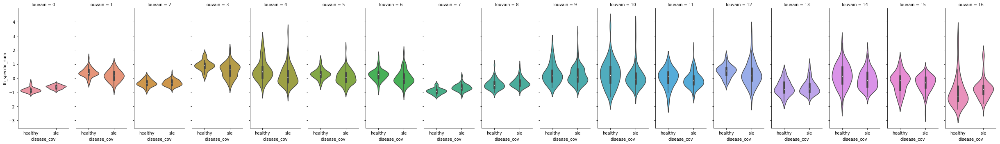

In [36]:
plot_df = adata.obs.groupby(['ind_cov','disease_cov','louvain'])['th_specific'].mean()
plot_df = plot_df.reset_index(name='th_specific_sum')

sb.catplot(x="disease_cov", y="th_specific_sum", hue='louvain', data=plot_df, kind='violin', col='louvain', dodge=False, aspect=0.4, sharex=False, sharey=True)

##n_cts=ct_df.shape[1]-1
for cluster_i in list(range(0,8)):
    cluster = plot_df.louvain.cat.categories[cluster_i]
    th_specific_sum = plot_df.th_specific_sum[plot_df.louvain == cluster]
    disease = plot_df.disease_cov[plot_df.louvain==cluster].astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    est=sm.OLS(th_specific_sum.astype(float), disease.astype(float), missing='drop')
    ##est=sm.OLS("myeloid_ifn~disease_cov", data=adata.obs.input,missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Cluster='+str(cluster)+',Beta='+str(effect)+', pvalue='+str(pval))

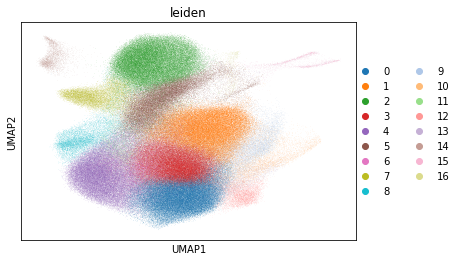

In [37]:
#plot UMAP of cell types colored by clusters
adata.uns['louvain_colors'] = sc.pl.palettes.vega_20_scanpy;
sc.pl.umap(adata, color='leiden')

# 7. Cell Type

In [38]:
adata.obs['ct_cov'] = adata.obs['batch_cov'].astype('object')
## do some manual cell type assignment
adata.obs.ct_cov[adata.obs.leiden == "0"] = "Naive CD4+" # CCR7, SOCS3-, TNF- CREM-
adata.obs.ct_cov[adata.obs.leiden == "1"] = "Th"# CCR7-, GATA3, RORA, CD45+, IL7R, CREM+
adata.obs.ct_cov[adata.obs.leiden == "2"] = "Cytotoxic CD8+" # PRF1, CD8+, IL7R-
adata.obs.ct_cov[adata.obs.leiden == "3"] = "Memory CD4+" # CD69+, CCR7+, SOCS3+ CREM+
adata.obs.ct_cov[adata.obs.leiden == "4"] = "Naive CD8+" # CCR7+, CD8+
adata.obs.ct_cov[adata.obs.leiden == "5"] = "Memory CD8+"# CREM+ CD8+, IL7R+
adata.obs.ct_cov[adata.obs.leiden == "6"] = "Naive CD4+" # CCR7+, FOXP1+
adata.obs.ct_cov[adata.obs.leiden == "7"] = "Cytotoxic CD4+"# PRF1+, CD8-, IL7+, CREM-, 
adata.obs.ct_cov[adata.obs.leiden == "8"] = "Naive CD4+" # CCR7+ CD8-, S100A4- 
adata.obs.ct_cov[adata.obs.leiden == "9"] = "T Reg" # IL2RA+, CTLA4+, FOXP3+
adata.obs.ct_cov[adata.obs.leiden == "10"] = "Th1" # IFN+, STAT1+
adata.obs.ct_cov[adata.obs.leiden == "11"] = "Platelet" # Platelet markers
adata.obs.ct_cov[adata.obs.leiden == "12"] = "Cycling CD4+" # STMN1+ SOX4+
adata.obs.ct_cov[adata.obs.leiden == "13"] = "Immature T" # PTCRA+
adata.obs.ct_cov[adata.obs.leiden == "14"] = "Myeloid" # MNDA, CD14, FCER1G
adata.obs.ct_cov[adata.obs.leiden == "15"] = "Cycling CD8+" # TYMS STMN1
adata.obs.ct_cov[adata.obs.leiden == "16"] = "B" #CD79A
adata.obs['ct_cov'] = adata.obs['ct_cov'].astype('category')

/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  after removing the cwd from sys.path.
/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexi

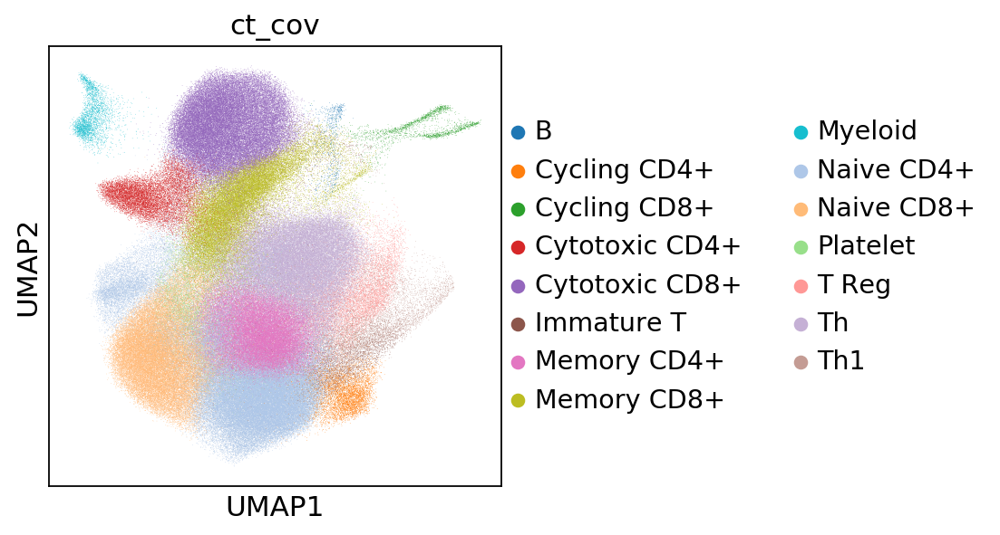

In [39]:
#plot UMAP of cell types colored by clusters
sc.settings.set_figure_params(dpi_save=500, format='png', transparent=True)
color_map = [
    '#1f77b4', '#ff7f0e', '#2ca02c', '#d62728',
    '#9467bd', '#8c564b', '#e377c2',
    '#bcbd22', '#17becf',
    '#aec7e8', '#ffbb78', '#98df8a', '#ff9896',
    '#c5b0d5', '#c49c94', '#f7b6d2',
    '#dbdb8d', '#9edae5',
    '#ad494a', '#8c6d31']
adata.uns['louvain_colors'] = sc.pl.palettes.vega_20_scanpy;
sc.pl.umap(adata, color='ct_cov', palette=color_map)

as a proportion of cell type
Cluster type:B
Beta=-0.10958746568849828, pvalue=0.003540481063727856
Cluster type:Cycling CD4+
Beta=0.3585861857552124, pvalue=0.1211243775141055
Cluster type:Cycling CD8+
Beta=-0.5523268734016242, pvalue=1.3211466175860532e-05
Cluster type:Cytotoxic CD4+
Beta=3.745773752610391, pvalue=9.486079390955468e-15
Cluster type:Cytotoxic CD8+
Beta=-10.007542402367138, pvalue=9.039870147125728e-06
Cluster type:Immature T
Beta=-0.4326121725731217, pvalue=1.4717851442363124e-06
Cluster type:Memory CD4+
Beta=11.271021007533342, pvalue=1.8485126806873651e-31
Cluster type:Memory CD8+
Beta=-4.902660197357467, pvalue=2.9507273650158404e-07
Cluster type:Myeloid
Beta=-0.5551094148665905, pvalue=0.0007931802768645102
Cluster type:Naive CD4+
Beta=8.297573813500323, pvalue=7.644319781507679e-06
Cluster type:Naive CD8+
Beta=2.488396925749443, pvalue=0.03381553709963493
Cluster type:Platelet
Beta=-0.6026457697391727, pvalue=0.00032575722331222394
Cluster type:T Reg
Beta=-1.43513

<Figure size 2400x800 with 0 Axes>

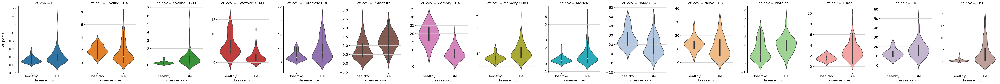

In [40]:
#get counts of cells for each cluster
ct_counts=adata.obs.groupby(['ind_cov', 'disease_cov','ct_cov'])['ct_cov'].count()
ct_percs = ct_counts/ct_counts.groupby(level=[0]).transform(sum)*100
ct_percs = ct_percs.reset_index(name='ct_percs')
ct_percs.ind_cov = ct_percs.ind_cov.apply(lambda x: x.split('_')[0])
ct_percs.ind_cov = ct_percs.ind_cov.astype("str")
ct_percs.reset_index(inplace=True)
ct_percs.ct_cov = ct_percs.ct_cov.astype("category")
ct_df=ct_percs.unstack(level=2, fill_value=0)

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell type')
for ct_i in list(range(0,15)):
    ct = ct_percs.ct_cov.cat.categories[ct_i]
    ct_perc = ct_percs.ct_percs[ct_percs.ct_cov==ct]
    disease = ct_percs.disease_cov[ct_percs.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    print('Cluster type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))

# #box plot as a proportion of cell type
# vars=[str(x) for x in list(range(n_cts))]
# ct_df['ind_cov']=ct_df.index.get_level_values('ind_cov').tolist()
# ct_df.index=ct_df['ind_cov']
# melted=pd.melt(ct_df, id_vars=['ind_cov', 'disease'], value_vars=vars)

#plot=sb.boxplot(x='disease', y='value', hue=ct_arg, data=melted).get_figure()
plt.figure(figsize=(30,10))
plot=sb.catplot(x='disease_cov', y='ct_percs', hue='ct_cov', data=ct_percs, kind='violin', col='ct_cov', dodge=False, aspect=.75, sharex=False, sharey=False, palette=sc.pl.palettes.vega_20_scanpy)
#plt.subplots_adjust(wspace=0.03)

# Remove contaminated clusters and divide analysis into CD4 and CD8

In [41]:
# CD4
CD4 = adata[adata.obs.ct_cov.isin(['Th', 'Memory CD4+', 'Naive CD4+', 'T Reg', 'Cycling CD4+', 'Cytotoxic CD4+', 'Th1', 'Immature T'])]
print(np.unique(adata.obs.ct_cov))
print(np.unique(CD4.obs.ct_cov))
# CD8
CD8 = adata[adata.obs.ct_cov.isin(['Memory CD8+', 'Naive CD8+', 'Cycling CD8+', 'Cytotoxic CD8+'])]


['B' 'Cycling CD4+' 'Cycling CD8+' 'Cytotoxic CD4+' 'Cytotoxic CD8+'
 'Immature T' 'Memory CD4+' 'Memory CD8+' 'Myeloid' 'Naive CD4+'
 'Naive CD8+' 'Platelet' 'T Reg' 'Th' 'Th1']
['Cycling CD4+' 'Cytotoxic CD4+' 'Immature T' 'Memory CD4+' 'Naive CD4+'
 'T Reg' 'Th' 'Th1']


# Compare UCSF healthy vs SLE CD4

In [42]:
# Remove Broad samples
CD4 = CD4[CD4.obs.Broad==0]
CD8 = CD8[CD8.obs.Broad==0]

['Cycling CD4+' 'Cytotoxic CD4+' 'Immature T' 'Memory CD4+' 'Naive CD4+'
 'T Reg' 'Th' 'Th1']
as a proportion of cell type
Cluster type:Cycling CD4+
Beta=-0.4763497157843854, pvalue=0.462949536884802
Cluster type:Cytotoxic CD4+
Beta=2.931673063711266, pvalue=0.00152773882023315
Cluster type:Immature T
Beta=-0.0364189146344968, pvalue=0.8675838660589497
Cluster type:Memory CD4+
Beta=-1.8342281679843493, pvalue=0.15249114963788232
Cluster type:Naive CD4+
Beta=26.13497410431112, pvalue=6.758535660811126e-14
Cluster type:T Reg
Beta=-3.5876158527226467, pvalue=1.0477742562388086e-06
Cluster type:Th
Beta=-16.39277706344483, pvalue=6.629967202033367e-08
Cluster type:Th1
Beta=-7.079512875503141, pvalue=0.001316093109944508


<Figure size 2400x800 with 0 Axes>

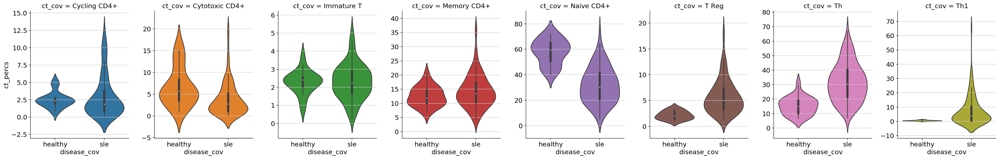

In [43]:
print(np.unique(CD4.obs.ct_cov))

#get counts of cells for each cluster
ct_counts=CD4.obs.groupby(['ind_cov', 'disease_cov','ct_cov'])['ct_cov'].count()
ct_percs = ct_counts/ct_counts.groupby(level=[0]).transform(sum)*100
ct_percs = ct_percs.reset_index(name='ct_percs')
ct_percs.ind_cov = ct_percs.ind_cov.apply(lambda x: x.split('_')[0])
ct_percs.ind_cov = ct_percs.ind_cov.astype("str")
ct_percs.reset_index(inplace=True)
ct_percs.ct_cov = ct_percs.ct_cov.astype("category")
ct_df=ct_percs.unstack(level=2, fill_value=0)

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell type')
for ct_i in list(range(0,len(np.unique(CD4.obs.ct_cov)))):
    ct = ct_percs.ct_cov.cat.categories[ct_i]
    ct_perc = ct_percs.ct_percs[ct_percs.ct_cov==ct]
    disease = ct_percs.disease_cov[ct_percs.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    print('Cluster type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))

# #box plot as a proportion of cell type
# vars=[str(x) for x in list(range(n_cts))]
# ct_df['ind_cov']=ct_df.index.get_level_values('ind_cov').tolist()
# ct_df.index=ct_df['ind_cov']
# melted=pd.melt(ct_df, id_vars=['ind_cov', 'disease'], value_vars=vars)

#plot=sb.boxplot(x='disease', y='value', hue=ct_arg, data=melted).get_figure()
plt.figure(figsize=(30,10))
plot=sb.catplot(x='disease_cov', y='ct_percs', hue='ct_cov', data=ct_percs, kind='violin', col='ct_cov', dodge=False, aspect=.75, sharex=False, sharey=False, palette=sc.pl.palettes.vega_20_scanpy)
#plt.subplots_adjust(wspace=0.03)


# IFN correlation - Cell Types

/netapp/home/richardkperez/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:29: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy


as a proportion of cell type
Cluster type:Cycling CD4+
Beta=0.001553450066661586, pvalue=0.1164924704000189
Cluster type:Cytotoxic CD4+
Beta=-0.002308409844098926, pvalue=0.34910454102693766
Cluster type:Immature T
Beta=-0.0017384209961415714, pvalue=0.09751518517379652
Cluster type:Memory CD4+
Beta=-0.01373773560567785, pvalue=0.03345426159847141
Cluster type:Naive CD4+
Beta=-0.06775391824385256, pvalue=8.438964768076763e-08
Cluster type:T Reg
Beta=0.0017258291332980821, pvalue=0.5359943182136016
Cluster type:Th
Beta=-0.011207720516955441, pvalue=0.5594830950007847
Cluster type:Th1
Beta=0.019678195882348697, pvalue=2.0353009520283905e-15
as a proportion of cell type
Cluster type:Cycling CD4+
Beta=0.001699898188690849, pvalue=0.1348619880248067
Cluster type:Cytotoxic CD4+
Beta=-0.00184746698610389, pvalue=0.5067797076592342
Cluster type:Immature T
Beta=-0.0021094744059539632, pvalue=0.07695878932339795
Cluster type:Memory CD4+
Beta=-0.01678777065799007, pvalue=0.02220088846104188
Clust

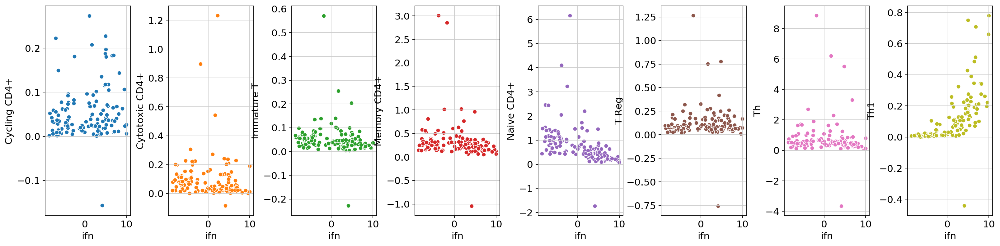

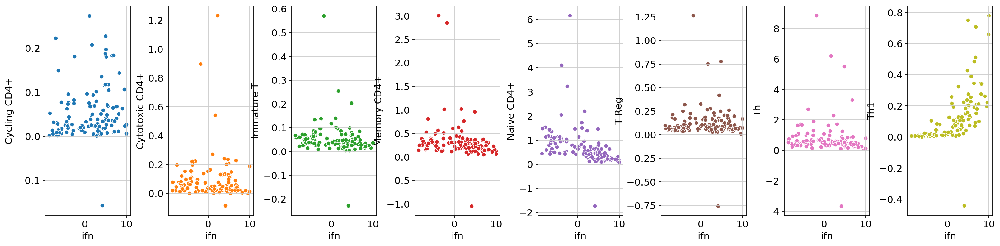

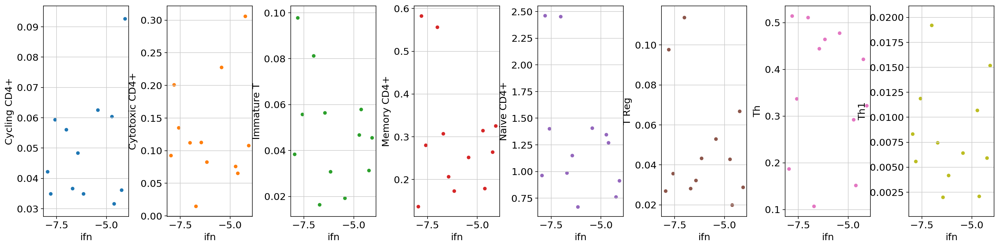

In [44]:
## Let's grab the clinical and labs data and compare to our single cell estimates
clues_clinical = pd.read_table("v2.clinical.data.txt", index_col=False)
clues_clinical.genotypeid = clues_clinical.genotypeid.apply(lambda x: x.split('_')[0])
clues_clinical.subjectid = clues_clinical.subjectid.astype("str")
joined = ct_percs.join(clues_clinical.set_index('genotypeid'), on='ind_cov')

t1_labs = pd.read_table("T1labs.csv",sep=",")
t1_labs.SubjectID = t1_labs.SubjectID.astype("str")
joined = joined.join(t1_labs.set_index('SubjectID'), on='subjectid')

### test new code
joined.AbsBaso = joined.AbsBaso/1000
joined.AbsEosino = joined.AbsEosino/1000
joined.AbsLympho = joined.AbsLympho/1000
joined.AbsNeutro = joined.AbsNeutro/1000
joined.AbsMono = joined.AbsMono/1000

joined = joined.assign(pbmc = joined.WhiteBloodCell-joined.AbsNeutro-joined.AbsEosino-joined.AbsBaso)

joined[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(str)

## now let's add in white blood cell counts for the immvar patients
immvar_pbmc = pd.read_table("immvar.pbmc.csv", index_col=False, sep=",")
immvar_pbmc.pbmc = immvar_pbmc.pbmc - (np.mean(immvar_pbmc.pbmc) - np.mean(joined.pbmc))

## this is not the most efficient code but will suffice for now
for i in list(range(12)) :
    igtb = immvar_pbmc.immvarid[i]
    joined.pbmc[joined.ind_cov==igtb] = immvar_pbmc.pbmc[i]

joined = joined.assign(estimate=joined.ct_percs/100*joined.pbmc)

joined[["ind_cov","disease_cov","ct_cov"]] = joined[["ind_cov","disease_cov","ct_cov"]].astype(str)
joined.plaquenilnow = joined.plaquenilnow.fillna(0)
joined.cellceptnow = joined.cellceptnow.fillna(0)
joined.steroralnow = joined.steroralnow.fillna(0)
joined.acrlymphopenia = joined.acrlymphopenia.fillna(0)

joined_pivot = joined.pivot_table(index=['ind_cov',"disease_cov","pbmc","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia"], columns="ct_cov", values="estimate")
joined_pivot.reset_index(inplace=True)
joined_pivot = joined_pivot[joined_pivot.pbmc > 0]
joined_pivot.disease_cov = pd.Categorical(joined_pivot.disease_cov,categories=['healthy','sle'], ordered=True)

ifn = pd.read_table("v2.ifn.sig.txt", sep=" ", index_col=False)
ifn.name = ifn.name.apply(lambda x: x.split('_')[0])
joined2 = ifn.join(joined.set_index("ind_cov"), on="name")
joined_pivot2 = joined2.pivot_table(index=['name',"disease_cov","pbmc","ifn","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia"], columns="ct_cov", values="estimate")
joined_pivot2.reset_index(inplace=True)

fig,ax = plt.subplots(nrows=1,ncols=8, figsize=(20,5))
fig.tight_layout()

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell type')
for ct_i in list(range(0,len(np.unique(CD4.obs.ct_cov)))):
    ct = ct_percs.ct_cov.cat.categories[ct_i]
    ct_perc = joined_pivot2[ct]
    ifn = joined_pivot2.ifn
    ifn = sm.add_constant(ifn)
    print('Cluster type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), ifn.astype(float),missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
for ct_i in list(range(0,len(np.unique(CD4.obs.ct_cov)))):
    ct = ct_percs.ct_cov.cat.categories[ct_i]
    sb.scatterplot(x="ifn", y=ct, data=joined_pivot2, color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
    ##sb.swarmplot(x="disease_cov", y=ct, data=joined_pivot, color="0", size=3, ax=ax[ct_i])
    
joined_pivot2_sle = joined_pivot2[joined_pivot2.disease_cov == "sle"]

fig,ax = plt.subplots(nrows=1,ncols=8, figsize=(20,5))
fig.tight_layout()

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell type')
for ct_i in list(range(0,len(np.unique(CD4.obs.ct_cov)))):
    ct = ct_percs.ct_cov.cat.categories[ct_i]
    ct_perc = joined_pivot2_sle[ct]
    ifn = joined_pivot2_sle.ifn
    ifn = sm.add_constant(ifn)
    print('Cluster type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), ifn.astype(float),missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
for ct_i in list(range(0,len(np.unique(CD4.obs.ct_cov)))):
    ct = ct_percs.ct_cov.cat.categories[ct_i]
    sb.scatterplot(x="ifn", y=ct, data=joined_pivot2_sle, color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
    ##sb.swarmplot(x="disease_cov", y=ct, data=joined_pivot, color="0", size=3, ax=ax[ct_i])
    
joined_pivot2_healthy = joined_pivot2[joined_pivot2.disease_cov == "healthy"]

fig,ax = plt.subplots(nrows=1,ncols=8, figsize=(20,5))
fig.tight_layout()

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell type')
for ct_i in list(range(0,len(np.unique(CD4.obs.ct_cov)))):
    ct = ct_percs.ct_cov.cat.categories[ct_i]
    ct_perc = joined_pivot2_healthy[ct]
    ifn = joined_pivot2_healthy.ifn
    ifn = sm.add_constant(ifn)
    print('Cluster type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), ifn.astype(float),missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
for ct_i in list(range(0,len(np.unique(CD4.obs.ct_cov)))):
    ct = ct_percs.ct_cov.cat.categories[ct_i]
    sb.scatterplot(x="ifn", y=ct, data=joined_pivot2_healthy, color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
    ##sb.swarmplot(x="disease_cov", y=ct, data=joined_pivot, color="0", size=3, ax=ax[ct_i])


# Compare UCSF healthy vs SLE CD8

as a proportion of cell type
Cluster type:Cycling CD8+
Beta=-0.7434311790630992, pvalue=0.0544382727390685
Cluster type:Cytotoxic CD8+
Beta=-18.712410308125726, pvalue=0.00010839385755342179
Cluster type:Memory CD8+
Beta=-7.927848330337708, pvalue=0.00871528548545463
Cluster type:Naive CD8+
Beta=27.441551149168085, pvalue=1.8740151788014017e-08


<Figure size 2400x800 with 0 Axes>

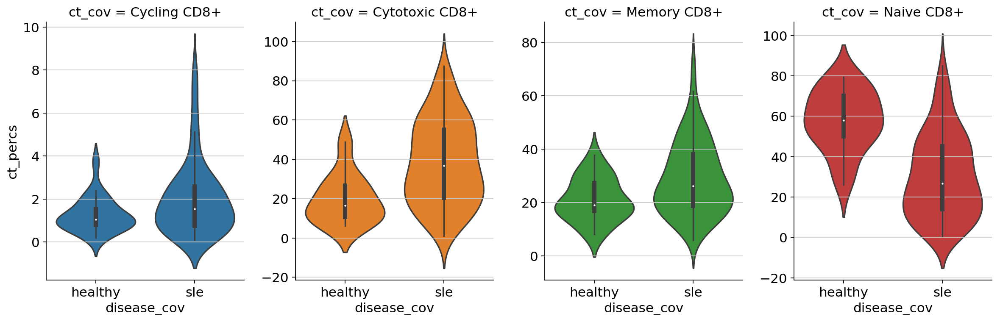

In [45]:

#get counts of cells for each cluster
ct_counts=CD8.obs.groupby(['ind_cov', 'disease_cov','ct_cov'])['ct_cov'].count()
ct_percs = ct_counts/ct_counts.groupby(level=[0]).transform(sum)*100
ct_percs = ct_percs.reset_index(name='ct_percs')
ct_percs.ind_cov = ct_percs.ind_cov.apply(lambda x: x.split('_')[0])
ct_percs.ind_cov = ct_percs.ind_cov.astype("str")
ct_percs.reset_index(inplace=True)
ct_percs.ct_cov = ct_percs.ct_cov.astype("category")
ct_df=ct_percs.unstack(level=2, fill_value=0)

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell type')
for ct_i in list(range(0,len(np.unique(CD8.obs.ct_cov)))):
    ct = ct_percs.ct_cov.cat.categories[ct_i]
    ct_perc = ct_percs.ct_percs[ct_percs.ct_cov==ct]
    disease = ct_percs.disease_cov[ct_percs.ct_cov==ct]
    disease = disease.astype("str")
    disease.values[disease=="sle"] = 0
    disease.values[disease=="healthy"] = 1
    disease = sm.add_constant(disease)
    ##data = data.assign(ct_perc=ct_perc)
    print('Cluster type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), disease.astype(float))
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))

# #box plot as a proportion of cell type
# vars=[str(x) for x in list(range(n_cts))]
# ct_df['ind_cov']=ct_df.index.get_level_values('ind_cov').tolist()
# ct_df.index=ct_df['ind_cov']
# melted=pd.melt(ct_df, id_vars=['ind_cov', 'disease'], value_vars=vars)

#plot=sb.boxplot(x='disease', y='value', hue=ct_arg, data=melted).get_figure()
plt.figure(figsize=(30,10))
plot=sb.catplot(x='disease_cov', y='ct_percs', hue='ct_cov', data=ct_percs, kind='violin', col='ct_cov', dodge=False, aspect=.75, sharex=False, sharey=False, palette=sc.pl.palettes.vega_20_scanpy)
#plt.subplots_adjust(wspace=0.03)

# IFN correlation Cell Type CD8+

In [ ]:
## Let's grab the clinical and labs data and compare to our single cell estimates
clues_clinical = pd.read_table("v2.clinical.data.txt", index_col=False)
clues_clinical.genotypeid = clues_clinical.genotypeid.apply(lambda x: x.split('_')[0])
clues_clinical.subjectid = clues_clinical.subjectid.astype("str")
joined = ct_percs.join(clues_clinical.set_index('genotypeid'), on='ind_cov')

t1_labs = pd.read_table("T1labs.csv",sep=",")
t1_labs.SubjectID = t1_labs.SubjectID.astype("str")
joined = joined.join(t1_labs.set_index('SubjectID'), on='subjectid')

### test new code
joined.AbsBaso = joined.AbsBaso/1000
joined.AbsEosino = joined.AbsEosino/1000
joined.AbsLympho = joined.AbsLympho/1000
joined.AbsNeutro = joined.AbsNeutro/1000
joined.AbsMono = joined.AbsMono/1000

joined = joined.assign(pbmc = joined.WhiteBloodCell-joined.AbsNeutro-joined.AbsEosino-joined.AbsBaso)

joined[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']] = joined[["subjectid",'WhiteBloodCell','AbsMono','AbsLympho','AbsNeutro','AbsEosino','AbsBaso','PlatCount']].astype(str)

## now let's add in white blood cell counts for the immvar patients
immvar_pbmc = pd.read_table("immvar.pbmc.csv", index_col=False, sep=",")
immvar_pbmc.pbmc = immvar_pbmc.pbmc - (np.mean(immvar_pbmc.pbmc) - np.mean(joined.pbmc))

## this is not the most efficient code but will suffice for now
for i in list(range(12)) :
    igtb = immvar_pbmc.immvarid[i]
    joined.pbmc[joined.ind_cov==igtb] = immvar_pbmc.pbmc[i]

joined = joined.assign(estimate=joined.ct_percs/100*joined.pbmc)

joined[["ind_cov","disease_cov","ct_cov"]] = joined[["ind_cov","disease_cov","ct_cov"]].astype(str)
joined.plaquenilnow = joined.plaquenilnow.fillna(0)
joined.cellceptnow = joined.cellceptnow.fillna(0)
joined.steroralnow = joined.steroralnow.fillna(0)
joined.acrlymphopenia = joined.acrlymphopenia.fillna(0)

joined_pivot = joined.pivot_table(index=['ind_cov',"disease_cov","pbmc","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia"], columns="ct_cov", values="estimate")
joined_pivot.reset_index(inplace=True)
joined_pivot = joined_pivot[joined_pivot.pbmc > 0]
joined_pivot.disease_cov = pd.Categorical(joined_pivot.disease_cov,categories=['healthy','sle'], ordered=True)

ifn = pd.read_table("v2.ifn.sig.txt", sep=" ", index_col=False)
ifn.name = ifn.name.apply(lambda x: x.split('_')[0])
joined2 = ifn.join(joined.set_index("ind_cov"), on="name")
joined_pivot2 = joined2.pivot_table(index=['name',"disease_cov","pbmc","ifn","plaquenilnow","cellceptnow","steroralnow","acrlymphopenia"], columns="ct_cov", values="estimate")
joined_pivot2.reset_index(inplace=True)

fig,ax = plt.subplots(nrows=1,ncols=8, figsize=(20,5))
fig.tight_layout()

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell type')
for ct_i in list(range(0,len(np.unique(CD8.obs.ct_cov)))):
    ct = ct_percs.ct_cov.cat.categories[ct_i]
    ct_perc = joined_pivot2[ct]
    ifn = joined_pivot2.ifn
    ifn = sm.add_constant(ifn)
    print('Cluster type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), ifn.astype(float),missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
for ct_i in list(range(0,len(np.unique(CD8.obs.ct_cov)))):
    ct = ct_percs.ct_cov.cat.categories[ct_i]
    sb.scatterplot(x="ifn", y=ct, data=joined_pivot2, color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
    ##sb.swarmplot(x="disease_cov", y=ct, data=joined_pivot, color="0", size=3, ax=ax[ct_i])
    
joined_pivot2_sle = joined_pivot2[joined_pivot2.disease_cov == "sle"]

fig,ax = plt.subplots(nrows=1,ncols=8, figsize=(20,5))
fig.tight_layout()

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell type')
for ct_i in list(range(0,len(np.unique(CD8.obs.ct_cov)))):
    ct = ct_percs.ct_cov.cat.categories[ct_i]
    ct_perc = joined_pivot2_sle[ct]
    ifn = joined_pivot2_sle.ifn
    ifn = sm.add_constant(ifn)
    print('Cluster type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), ifn.astype(float),missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
for ct_i in list(range(0,len(np.unique(CD8.obs.ct_cov)))):
    ct = ct_percs.ct_cov.cat.categories[ct_i]
    sb.scatterplot(x="ifn", y=ct, data=joined_pivot2_sle, color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
    ##sb.swarmplot(x="disease_cov", y=ct, data=joined_pivot, color="0", size=3, ax=ax[ct_i])
    
joined_pivot2_healthy = joined_pivot2[joined_pivot2.disease_cov == "healthy"]

fig,ax = plt.subplots(nrows=1,ncols=8, figsize=(20,5))
fig.tight_layout()

##n_cts=ct_df.shape[1]-1
print('as a proportion of cell type')
for ct_i in list(range(0,len(np.unique(CD8.obs.ct_cov)))):
    ct = ct_percs.ct_cov.cat.categories[ct_i]
    ct_perc = joined_pivot2_healthy[ct]
    ifn = joined_pivot2_healthy.ifn
    ifn = sm.add_constant(ifn)
    print('Cluster type:'+ ct)
    est=sm.OLS(ct_perc.astype(float), ifn.astype(float),missing='drop')
    est=est.fit()
    effect=est.params[1]
    pval=est.pvalues[1]
    print('Beta='+str(effect)+', pvalue='+str(pval))
    
for ct_i in list(range(0,len(np.unique(CD8.obs.ct_cov)))):
    ct = ct_percs.ct_cov.cat.categories[ct_i]
    sb.scatterplot(x="ifn", y=ct, data=joined_pivot2_healthy, color=sc.pl.palettes.vega_20_scanpy[ct_i], ax=ax[ct_i])
    ##sb.swarmplot(x="disease_cov", y=ct, data=joined_pivot, color="0", size=3, ax=ax[ct_i])


# Compare CD4 analysis with Broad Healthy controls instead

# Compare CD4 analysis for Broad vs UCSF controls